# Sheet 12

## 12.1

### 3. 

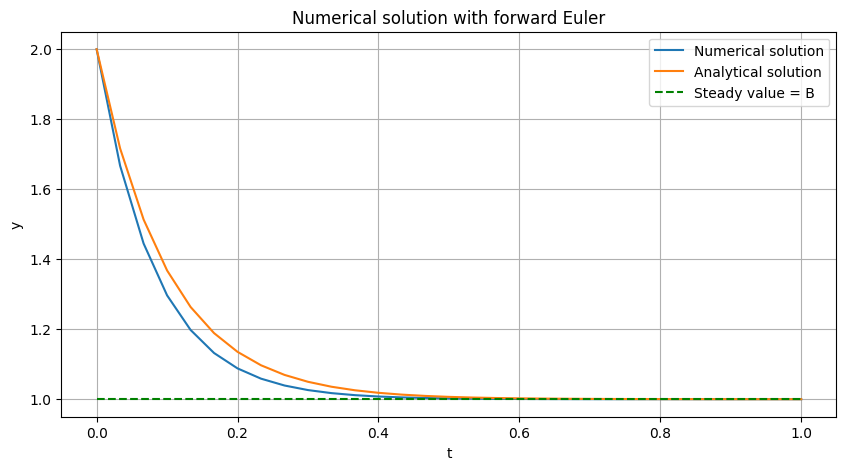

In [60]:
import numpy as np
import matplotlib.pyplot as plt

# Set up parameters
A = 10
B = 1
dt = 0.0333
time_steps = 30

# Inital condition
y0 = 2

# Initializating variables
y = y0
y_history = []

# Loop for implementig forward Euler
for i in range(time_steps + 1):
    y_history.append(y)
    y -= dt * A * ( y - B )
    

# Calculate the analyitcal solution
t = np.linspace(0 , 1 , time_steps + 1)
y_analytic = B + np.exp(-A * t)


# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(t, y_history, label = "Numerical solution")
plt.plot(t, y_analytic, label = "Analytical solution")
plt.hlines(B, 0, 1, colors= 'green', linestyles='dashed', label='Steady value = B')
plt.legend()
plt.title("Numerical solution with forward Euler")
plt.xlabel("t")
plt.ylabel("y")
plt.grid(True)
plt.show()

It is stable and the solution converges to the steady value as expected.

# 4. 

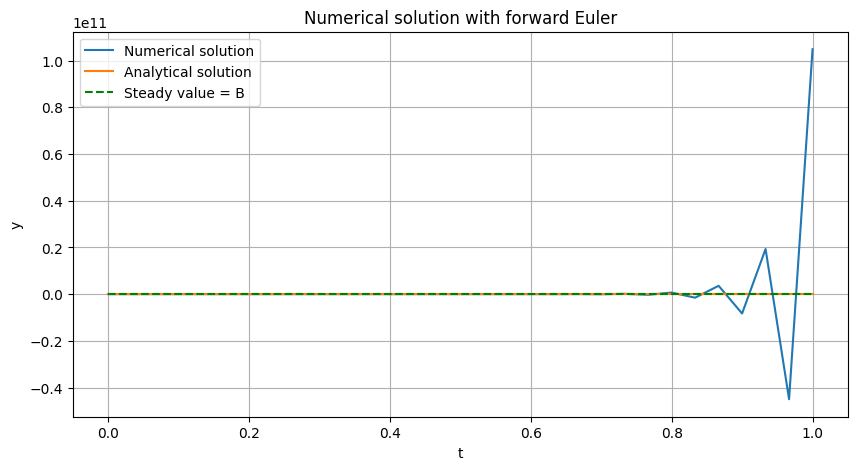

In [61]:
# Change in the parameters
A = 100

# Initializating variables
y = y0
y_history = []

# Loop for implementig forward Euler
for i in range(time_steps  + 1):
    y_history.append(y)
    y -= dt * A * ( y - B )
    

# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(t, y_history, label = "Numerical solution")
plt.plot(t, y_analytic, label = "Analytical solution")
plt.hlines(B, 0, 1, colors= 'green', linestyles='dashed', label='Steady value = B')
plt.legend()
plt.title("Numerical solution with forward Euler")
plt.xlabel("t")
plt.ylabel("y")
plt.grid(True)
plt.show()

In this case, explicit Euler does not converge and becomes unstable.

### 5.

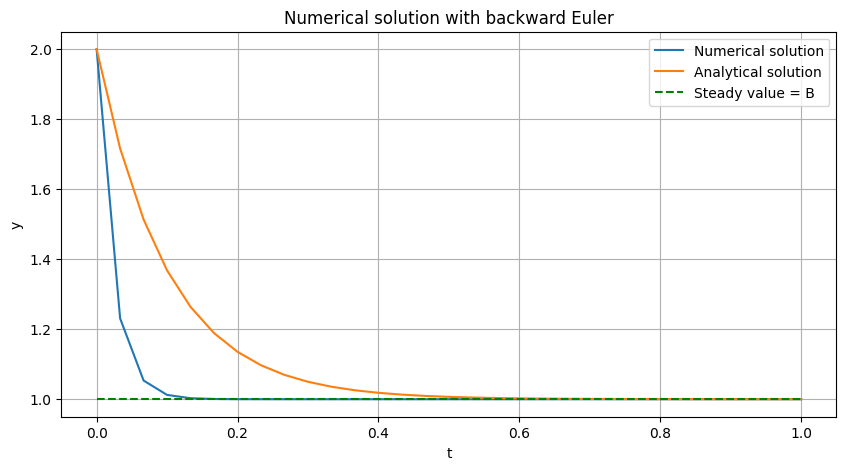

In [62]:
# Same conditions as before

# Initializating variables
y = y0
y_history = []

# Loop for implementig backward Euler
for i in range(time_steps  + 1):
    y_history.append(y)
    y = (y + A * B * dt) / (1 + A * dt)
    

# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(t, y_history, label = "Numerical solution")
plt.plot(t, y_analytic, label = "Analytical solution")
plt.hlines(B, 0, 1, colors= 'green', linestyles='dashed', label='Steady value = B')
plt.legend()
plt.title("Numerical solution with backward Euler")
plt.xlabel("t")
plt.ylabel("y")
plt.grid(True)
plt.show()

As expected, this method is stable. It converges asymptotically to the steady solution.

### 7

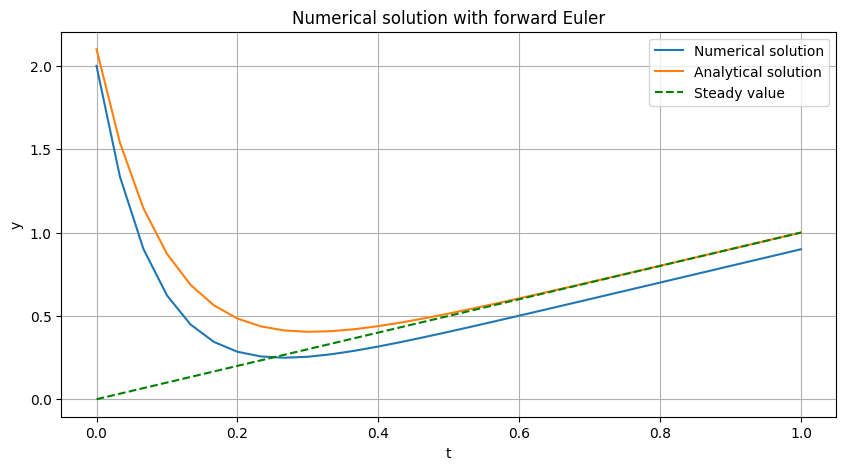

In [63]:
# Set up parameters
A = 10

# Initializating variables
y = y0
y_history = []

# Loop for implementig forward Euler
for i in range(time_steps  + 1):
    y_history.append(y)
    y -= dt * A * ( y - B * t[i])
    

# Calculate the analyitcal solution
y_analytic =  2.1 * np.exp(-A * t) + B * t

# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(t, y_history, label = "Numerical solution")
plt.plot(t, y_analytic, label = "Analytical solution")
plt.plot(t, B * t, color= 'green', linestyle='dashed', label='Steady value')
plt.legend()
plt.title("Numerical solution with forward Euler")
plt.xlabel("t")
plt.ylabel("y")
plt.grid(True)
plt.show()

We can see the numerical stays below the steady value in the steady upward groth section as the exercise stated.

### 8.

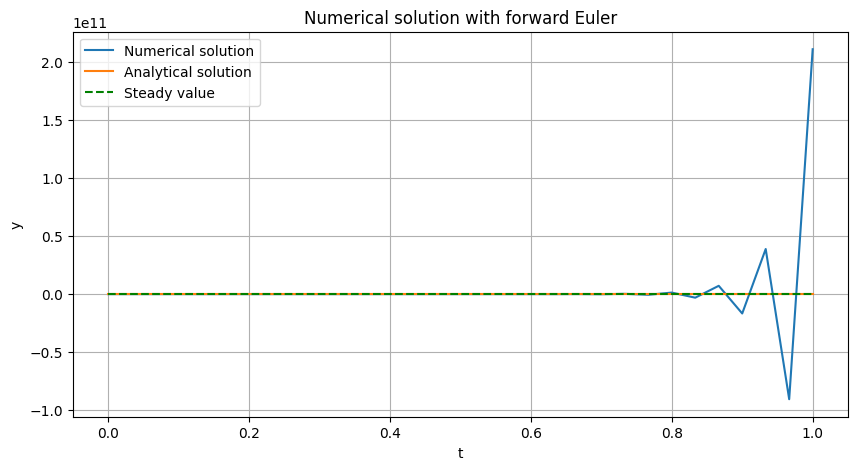

In [64]:
# Set up parameters
A = 100

# Initializating variables
y = y0
y_history = []

# Loop for implementig forward Euler
for i in range(time_steps  + 1):
    y_history.append(y)
    y -= dt * A * ( y - B * t[i])
    

# Calculate the analyitcal solution
y_analytic =  2.1 * np.exp(-A * t) + B * t

# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(t, y_history, label = "Numerical solution")
plt.plot(t, y_analytic, label = "Analytical solution")
plt.plot(t, B * t, color= 'green', linestyle='dashed', label='Steady value')
plt.legend()
plt.title("Numerical solution with forward Euler")
plt.xlabel("t")
plt.ylabel("y")
plt.grid(True)
plt.show()

Again, with A = 100 the model becomes unstable. In this cas, the analytical solution and the steady value do not show the growth we were expecting, but it is due to the sclae of the y axis. The divergence of the numerical solution is so big that the lineal growth is not visible in comparison.

### 9.

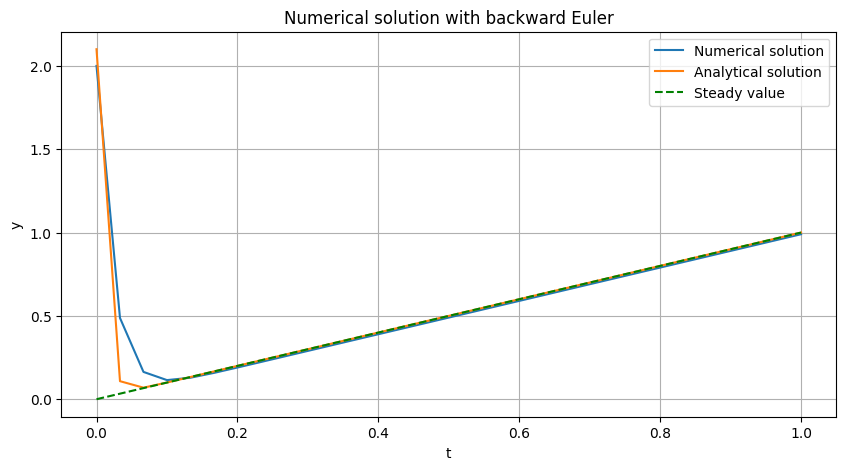

In [67]:
# Initializating variables
y = y0
y_history = []

# In the backward Euler, the time is t_{n+1}, so we shift the t list one position to the right
t_shift = np.linspace(0 + dt, 1 + dt, time_steps + 1)

# Loop for implementig backward Euler
for i in range(time_steps + 1):
    y_history.append(y)
    y = (y + A * B * t_shift[i] * dt) / (1 + A * dt)
    
# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(t, y_history, label = "Numerical solution")
plt.plot(t, y_analytic, label = "Analytical solution")
plt.plot(t, B * t, color= 'green', linestyle='dashed', label='Steady value')
plt.legend()
plt.title("Numerical solution with backward Euler")
plt.xlabel("t")
plt.ylabel("y")
plt.grid(True)
plt.show()

Here, we can see the model becames stable again, and much more accurate with the steady value.

## 12.2

### 1.

Simulation stopped: r became non-physical at step 38


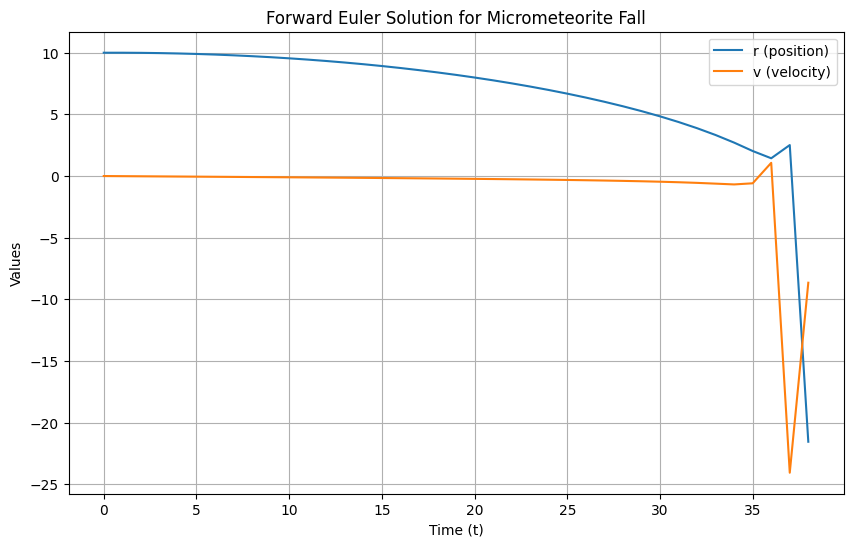

In [86]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
GM = 1.0  
R = 1.0   # Planet radius
H = 0.3   # Atmospheric scale height
A = 100.0 # Friction coefficient
r0 = 10.0 # Initial position
v0 = 0.0  # Initial velocity
t_max = 100.0  # Total simulation time
N = 100  # Number of time steps
dt = t_max / N  # Time step size

# Time array
t = np.linspace(0, t_max, N+1)

# Initialize arrays for r and v
r = np.zeros(N+1)
v = np.zeros(N+1)
r[0] = r0
v[0] = v0

# Acceleration function
def acceleration(r, v):
    if r <= 0:  # Prevent division by zero or negative radius
        return 0
    grav = -GM / r**2
    friction = -A * np.exp(-(r - R) / H) * v
    return grav + friction

# Forward Euler integration
for n in range(N):
    if r[n] <= 0:
        print(f"Simulation stopped: r became non-physical at step {n}")
        break
    r[n+1] = r[n] + dt * v[n]
    v[n+1] = v[n] + dt * acceleration(r[n], v[n])

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(t[:n+1], r[:n+1], label="r (position)")
plt.plot(t[:n+1], v[:n+1], label="v (velocity)")
plt.xlabel("Time (t)")
plt.ylabel("Values")
plt.title("Forward Euler Solution for Micrometeorite Fall")
plt.legend()
plt.grid()
plt.show()

### 2.

In [87]:
from scipy.linalg import lu_factor, lu_solve

def jacobian(r, v):
    dr = 2 * GM / r**3  # Partial derivative of acceleration wrt r
    dv = -A * np.exp(-(r - R) / H)  # Partial derivative of acceleration wrt v
    J = np.array([[0, 1], [dr, dv]])
    return J


def Euler_backward(r, v, N_int = 4):
    r_prev, v_prev = r, v
    r_next, v_next = r.copy(), v.copy()
    
    for _ in range(N_int):  # Perform 4 Newton-Raphson iterations
        J = jacobian(r_next, v_next)
        A_matrix = np.eye(2) / dt - J  # Jacobian matrix for Newton step
        
        r_res = r_next - r_prev - dt * v_next
        v_res = v_next - v_prev - dt * acceleration(r_next, v_next)
        res = np.array([r_res, v_res])  # Compute residual

        # LU decomposition and solve
        lu, piv = lu_factor(A_matrix)
        delta_q = lu_solve((lu, piv), res)

        # Update q_next
        r_next -= delta_q[0]
        v_next -= delta_q[1]
    
    return r_next, v_next

### 3.

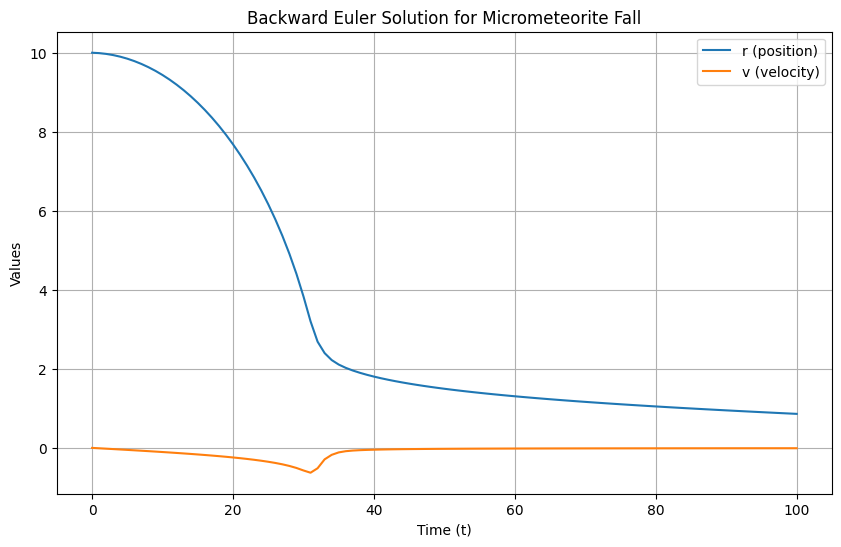

In [88]:
# Initialize arrays for r and v
r = np.zeros(N+1)
v = np.zeros(N+1)
r[0] = r0
v[0] = v0


# Backward Euler loop
for n in range(N):
    if r[n] <= 0:
        print(f"Simulation stopped: r became non-physical at step {n}")
        break
    r[n+1], v[n+1] = Euler_backward(r[n], v[n])

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(t, r, label="r (position)")
plt.plot(t, v, label="v (velocity)")
plt.xlabel("Time (t)")
plt.ylabel("Values")
plt.title("Backward Euler Solution for Micrometeorite Fall")
plt.legend()
plt.grid()
plt.show()

### 4. and 5.

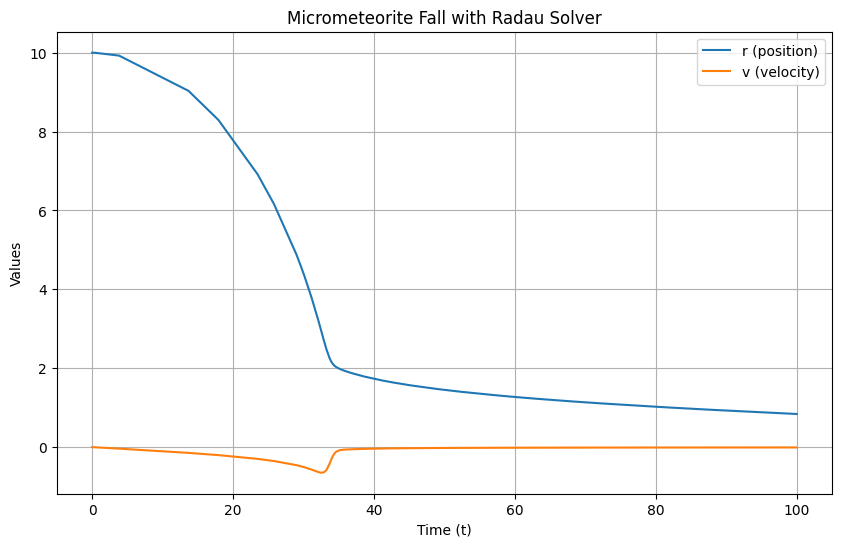

In [89]:
from scipy.integrate import solve_ivp

# System of equations
def micrometeorite_system(t, q):
    r, v = q
    if r <= 0:
        return [0, 0]  # Stop integration when r <= 0
    drdt = v
    dvdt = -GM / r**2 - A * np.exp(-(r - R) / H) * v
    return [drdt, dvdt]

# Initial conditions
q0 = [r0, v0]

# Time range for integration
t_span = (0, t_max)

# Solve using Radau method
solution = solve_ivp(
    micrometeorite_system, t_span, q0, method='Radau', dense_output=True
)

# Extract results
t = solution.t
r = solution.y[0]
v = solution.y[1]

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(t, r, label="r (position)")
plt.plot(t, v, label="v (velocity)")
plt.xlabel("Time (t)")
plt.ylabel("Values")
plt.title("Micrometeorite Fall with Radau Solver")
plt.legend()
plt.grid()
plt.show()

## 12.3

### 1.

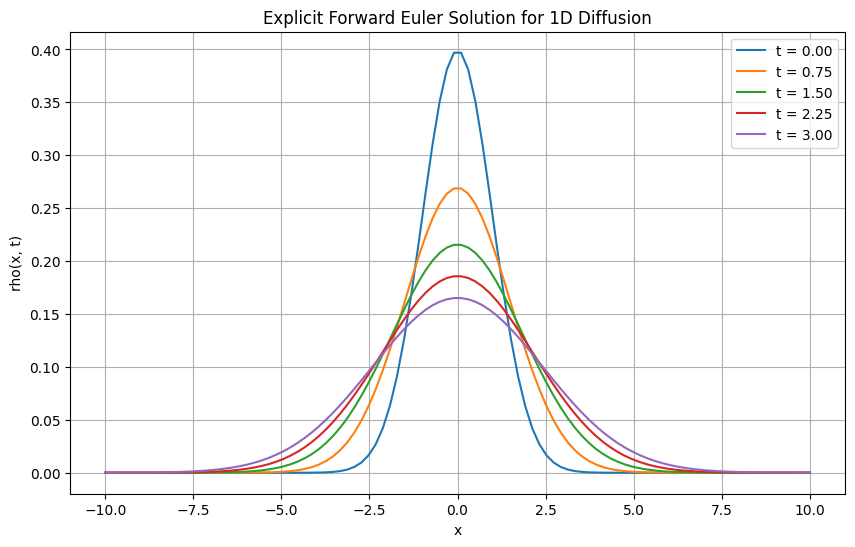

In [109]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
D = 1.0         # Diffusion coefficient
x_min, x_max = -10, 10  # Spatial domain
nx = 100        # Number of spatial grid points
t_max = 3.0     # Maximum simulation time
w0 = 1.0        # Initial Gaussian width

# Discretization
dx = (x_max - x_min) / (nx - 1)  # Spatial step size
dt = 0.5 * dx**2 / D             # Time step size (CFL condition)
nt = int(t_max / dt) + 1         # Number of time steps

# Spatial and initial condition
x = np.linspace(x_min, x_max, nx)
rho = np.exp(-x**2 / (2 * w0**2)) / np.sqrt(2 * np.pi * w0**2)

# Boundary conditions
rho[0] = 0
rho[-1] = 0

# Time integration using forward Euler
rho_t = np.zeros((nt, nx))
rho_t[0, :] = rho  # Store initial condition

for n in range(nt - 1):
    rho_next = np.copy(rho_t[n, :])
    for i in range(1, nx - 1):  # Update interior points only
        rho_next[i] = rho_t[n, i] + (D * dt / dx**2) * (rho_t[n, i+1] - 2 * rho_t[n, i] + rho_t[n, i-1])
    rho_t[n+1, :] = rho_next
    # Apply boundary conditions
    rho_t[n+1, 0] = 0
    rho_t[n+1, -1] = 0

# Visualization
plt.figure(figsize=(10, 6))
for i, time in enumerate(np.linspace(0, t_max, 5)):
    plt.plot(x, rho_t[int(i * nt / 5)], label=f"t = {time:.2f}")
plt.xlabel("x")
plt.ylabel("rho(x, t)")
plt.title("Explicit Forward Euler Solution for 1D Diffusion")
plt.legend()
plt.grid()
plt.show()


In [110]:
from matplotlib.animation import FuncAnimation

# Function to create a smooth, professional animation
def simulate_advection_ani(steps=nt, fps=30):
    # Plotting setup
    fig, ax = plt.subplots(figsize=(8, 6))
    line, = ax.plot(x, rho_t[0], color='b', lw=2, label="Density")
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(0, 1.1 * rho_t.max())
    ax.set_xlabel('x', fontsize=14)
    ax.set_ylabel('Density', fontsize=14)
    ax.set_title('1D Advection Simulation', fontsize=16)
    ax.legend(fontsize=12)
    ax.grid(True)

    # Animation function
    def update(frame):
        line.set_ydata(rho_t[frame])
        ax.set_title(f"Time Step: {frame} | Time: {frame * dt:.2f} s", fontsize=14)
        return line,

    # Create the animation
    ani = FuncAnimation(fig, update, frames=steps, blit=True, interval=1000 / fps)

    # Display animation inline
    from IPython.display import HTML
    plt.close(fig)
    return HTML(ani.to_jshtml())

# Generate and display the animation
simulate_advection_ani(steps=nt, fps=30)


### 2.

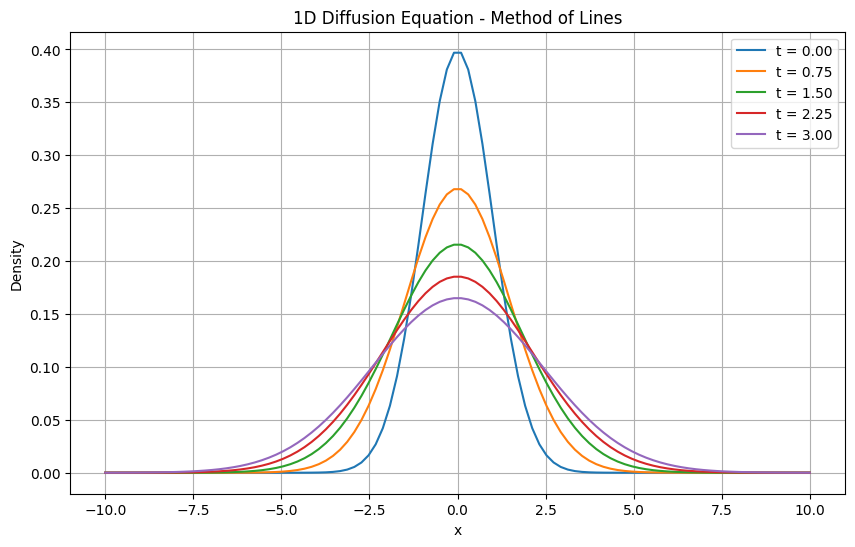

In [117]:
from scipy.integrate import solve_ivp

# Initial condition: Gaussian profile
rho0 = np.exp(-x**2 / (2 * w0**2)) / np.sqrt(2 * np.pi * w0**2)
rho0[0] = 0  # Enforce boundary condition at x = -10
rho0[-1] = 0  # Enforce boundary condition at x = 10
t_span = (0, 3.0)  # Time interval

# Function to compute derivatives for all grid points
def diffusion_system(t, rho):
    drho_dt = np.zeros_like(rho)
    for i in range(1, nx-1):  # Apply finite difference for interior points
        drho_dt[i] = D * (rho[i-1] - 2 * rho[i] + rho[i+1]) / dx**2
    return drho_dt

# Solve the system using solve_ivp
solution = solve_ivp(
    diffusion_system, t_span, rho0, method="Radau", t_eval=np.linspace(0, 3, 100)
)

# Extract results
t = solution.t
rho_t = solution.y

# Plot results at different times
plt.figure(figsize=(10, 6))
for i, time in enumerate(np.linspace(0, 3, 5)):  # Plot at 5 time slices
    plt.plot(x, rho_t[:, int(i * len(t) / 5)], label=f"t = {time:.2f}")
plt.xlabel("x")
plt.ylabel("Density")
plt.title("1D Diffusion Equation - Method of Lines")
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Now rho_t has shape (nx, nt) and not (nt, nx) as before.
rho_t = np.transpose(rho_t)
simulate_advection_ani(steps=len(t), fps=30)

With both methods we see similar results, suggesting that both methods are accurately solving the diffusion equation and converging to the same solution.